# Introduction
This is the notebook for work done related to the Stand-Your-Ground law in Michigan project.

## Imports
Mostly data manipulation and visualization tools.

In [86]:
# interactive map with geopandas
from bokeh.embed import file_html
from bokeh.io import output_file, show,output_notebook, reset_output
from bokeh.layouts import widgetbox, row, column
from bokeh.models import (CDSView, ColorBar, ColumnDataSource,
                          CustomJS, CustomJSFilter, Div, FixedTicker,
                          GeoJSONDataSource, HoverTool,
                          LinearColorMapper, Slider)
from bokeh.palettes import brewer, Spectral6
from bokeh.plotting import figure
from bokeh.resources import CDN

# datetime
from datetime import datetime

# geographical files
import geopandas as gpd

# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

from IPython import get_ipython
ipython = get_ipython()

from itertools import cycle
from itertools import product

# autoreload extension
if 'autoreload' not in ipython.extension_manager.loaded:
    %load_ext autoreload

%autoreload 2

import json

# import jtplot submodule from jupyterthemes
from jupyterthemes import jtplot
# currently installed theme will be used to
# set plot style if no arguments provided
jtplot.style()

import math

# regular plotting in Python
import matplotlib.pyplot as plt
import matplotlib.ticker as plticker
import matplotlib.dates as mdates
%matplotlib inline

# basic data package
import numpy as np

import os

# Data manipulation
import pandas as pd
pd.options.display.max_columns = 50
pd.options.display.max_rows = 30

# Visualizations
import chart_studio.plotly as py
import plotly.express as px
import plotly.graph_objs as go
import plotly.io as pio
from plotly.validators.scatter.marker import SymbolValidator

# plotting subplots next to each other in Python
import seaborn as sns

# facilitate with plotting interactive graphics
import scipy.spatial as spatial
import scipy.stats

from sklearn.linear_model import LinearRegression

# modeling
import statsmodels.api as sm

ModuleNotFoundError: No module named 'bokeh'

In [19]:
jtplot.reset()
# jtplot.style()

In [112]:
# class for interactive graphics
def fmt(x, y):
    return 'x: {x:0.2f}\ny: {y:0.2f}'.format(x=x, y=y)

class FollowDotCursor(object):
    """Display the x,y location of the nearest data point.
    https://stackoverflow.com/a/4674445/190597 (Joe Kington)
    https://stackoverflow.com/a/13306887/190597 (unutbu)
    https://stackoverflow.com/a/15454427/190597 (unutbu)
    """
    def __init__(self, ax, x, y, tolerance=5, formatter=fmt, offsets=(-20, 20)):
        try:
            x = np.asarray(x, dtype='float')
        except (TypeError, ValueError):
            x = np.asarray(mdates.date2num(x), dtype='float')
        except:
            x = np.asarray(x.astype(int))
        y = np.asarray(y, dtype='float')
        mask = ~(np.isnan(x) | np.isnan(y))
        x = x[mask]
        y = y[mask]
        self._points = np.column_stack((x, y))
        self.offsets = offsets
        y = y[np.abs(y-y.mean()) <= 3*y.std()]
        self.scale = x.ptp()
        self.scale = y.ptp() / self.scale if self.scale else 1
        self.tree = spatial.cKDTree(self.scaled(self._points))
        self.formatter = formatter
        self.tolerance = tolerance
        self.ax = ax
        self.fig = ax.figure
        self.ax.xaxis.set_label_position('top')
        self.dot = ax.scatter(
            [x.min()], [y.min()], s=130, color='green', alpha=0.7)
        self.annotation = self.setup_annotation()
        plt.connect('motion_notify_event', self)

    def scaled(self, points):
        points = np.asarray(points)
        return points * (self.scale, 1)

    def __call__(self, event):
        ax = self.ax
        # event.inaxes is always the current axis. If you use twinx, ax could be
        # a different axis.
        if event.inaxes == ax:
            x, y = event.xdata, event.ydata
        elif event.inaxes is None:
            return
        else:
            inv = ax.transData.inverted()
            x, y = inv.transform([(event.x, event.y)]).ravel()
        annotation = self.annotation
        x, y = self.snap(x, y)
        annotation.xy = x, y
        annotation.set_text(self.formatter(x, y))
        self.dot.set_offsets(np.column_stack((x, y)))
        bbox = self.annotation.get_window_extent()
        self.fig.canvas.blit(bbox)
        self.fig.canvas.draw_idle()

    def setup_annotation(self):
        """Draw and hide the annotation box."""
        annotation = self.ax.annotate(
            '', xy=(0, 0), ha = 'right',
            xytext = self.offsets, textcoords = 'offset points', va = 'bottom',
            bbox = dict(
                boxstyle='round,pad=0.5', fc='yellow', alpha=0.75),
            arrowprops = dict(
                arrowstyle='->', connectionstyle='arc3,rad=0'))
        return annotation

    def snap(self, x, y):
        """Return the value in self.tree closest to x, y."""
        dist, idx = self.tree.query(self.scaled((x, y)), k=1, p=1)
        try:
            return self._points[idx]
        except IndexError:
            # IndexError: index out of bounds
            return self._points[0]

# Population Data
Examining and plotting the population data.

In [7]:
# read in the population data from the .dta file
mipopl = pd.read_stata("MI_mo_popl.dta")

In [36]:
# change month column to integer
mipopl['month'] = mipopl['month'].astype(int)

In [4]:
mipopl['year'].unique()

array([1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000,
       2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011,
       2012, 2013, 2014, 2015, 2016, 2017], dtype=int16)

In [37]:
# make date variable
mipopl['date'] = mipopl['month'].map(str) + '-' + mipopl['year'].map(str)
mipopl['date'] = pd.to_datetime(mipopl['date'], format='%m-%Y').dt.strftime('%m-%Y')

In [33]:
mipopl.head()

,year,month,popl
0,1990,1.0,9.268182e+06
1,1990,2.0,9.275229e+06
2,1990,3.0,9.282275e+06
3,1990,4.0,9.289322e+06
4,1990,5.0,9.296369e+06


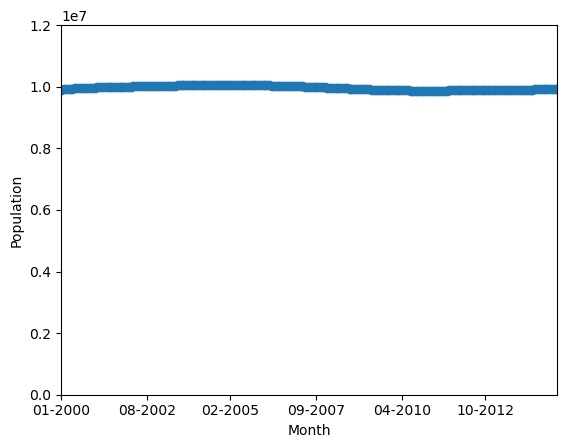

In [92]:
# plot the monthly population of the relevant years
fig, ax = plt.subplots()
plt.plot_date(mipopl['date'], mipopl['popl'])
plt.xlabel('Month')
plt.ylabel('Population')
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
ax.set_xlim(['01-2000', '12-2014'])
ax.set_ylim(ymin=0,ymax=1.2e7)
# plt.savefig("mipopl.png")
plt.show();

In [172]:
# find the population of Jan 2000
start_popl = mipopl[(mipopl['year'] == 2000) & (mipopl['month'] == 1)]['popl'].iloc[0]
print("Popl in Jan 2000:")
mipopl.loc[mipopl['popl'] == start_popl]

# find the highest population point and the highest population
max_popl = mipopl[(mipopl['year'] >= 2000) & (mipopl['year'] < 2015)]['popl'].max()
print("Max popl:")
mipopl.loc[mipopl['popl'] == max_popl]
max_popl/start_popl

# find the lowest population point and the lowest population
min_popl = mipopl[(mipopl['year'] >= 2000) & (mipopl['year'] < 2015)]['popl'].min()
print("Min popl:")
mipopl.loc[mipopl['popl'] == min_popl]
min_popl/start_popl

# find the population of Dec 2014
end_popl = mipopl[(mipopl['year'] == 2014) & (mipopl['month'] == 12)]['popl'].iloc[0]
print("Popl in Dec 2014:")
mipopl.loc[mipopl['popl'] == end_popl]
end_popl/start_popl

Popl in Jan 2000:


,year,month,popl,date
120,2000,1,9908112.5,01-2000


Max popl:


,year,month,popl,date
174,2004,7,10055315.0,07-2004


1.0148567651003155

Min popl:


,year,month,popl,date
258,2011,7,9876199.0,07-2011


0.9967790535281064

Popl in Dec 2014:


,year,month,popl,date
299,2014,12,9916131.25,12-2014


1.0008093115616117

In [142]:
max_popl/start_popl

120    1.014857
Name: popl, dtype: float64

In [143]:
min_popl/start_popl

120    0.996779
Name: popl, dtype: float64

# NIBRS Participation Date Data
Get a sense of when ORIs started participating in the NIBRS

In [52]:
# read in agency reporting data
df_part_date = pd.read_csv('agencies2000toPresent.csv')

In [53]:
# keep the data for the state of Michigan
df_part_date = df_part_date[df_part_date['state_name']=='Michigan']

In [57]:
# change the format of the date column to datetime
df_part_date['nibrs_start_date']=pd.to_datetime(df_part_date['nibrs_start_date'], 
                                                format='%Y-%m-%d').dt.floor('d')


In [65]:
df_part_date['nibrs_start_date'].head()

9280   1998-01-01
9281   1995-12-01
9282          NaT
9283          NaT
9284   1998-01-01
Name: nibrs_start_date, dtype: datetime64[ns]

In [70]:
df_part_date

,data_year,ori,legacy_ori,covered_by_legacy_ori,direct_contributor_flag,dormant_flag,dormant_year,reporting_type,ucr_agency_name,ncic_agency_name,pub_agency_name,pub_agency_unit,agency_status,state_id,state_name,state_abbr,state_postal_abbr,division_code,division_name,region_code,region_name,region_desc,agency_type_name,population,submitting_agency_id,...,summary_rape_def,pe_reported_flag,male_officer,male_civilian,male_total,female_officer,female_civilian,female_total,?column?,_1,nibrs_cert_date,nibrs_start_date,nibrs_leoka_start_date,nibrs_ct_start_date,nibrs_multi_bias_start_date,nibrs_off_eth_start_date,covered_flag,county_name,msa_name,publishable_flag,participated,nibrs_participated,asr_participated,hc_participated,supp_participated
9280,2000,MI0100100,MI0100100,NaN,N,N,NaN,I,SP: ALCONA COUNTY,SP: ALCONA COUNTY,State Police:,Alcona County,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,State Police,0,23374.0,...,L,N,0.0,0.0,0.0,NaN,NaN,NaN,0,0,1994-10-01,1998-01-01,2009-07-01,2012-07-01,2017-01-01,2017-01-01,N,ALCONA,Non-MSA,Y,Y,Y,Y,Y,Y
9281,2000,MI0110100,MI0110100,NaN,N,N,NaN,I,ALCONA,ALCONA CO SO HARRISVILLE,Alcona,NaN,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,County,11719,23374.0,...,L,Y,13.0,4.0,17.0,0.0,8.0,8.0,0,0,1994-10-01,1995-12-01,2009-07-01,2012-07-01,2017-01-01,2017-01-01,N,ALCONA,Non-MSA,Y,Y,Y,Y,Y,Y
9282,2000,MI0146100,MI0146100,MI0110100,N,N,NaN,S,HARRISVILLE,HARRISVILLE PD,Harrisville,NaN,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,City,514,23374.0,...,NaN,N,1.0,0.0,1.0,0.0,0.0,0.0,0,0,1994-10-01,NaT,NaN,NaN,NaN,NaN,Y,ALCONA,Non-MSA,N,N,N,N,N,N
9283,2000,MI0153300,MI0153300,MI0110100,N,N,NaN,S,LINCOLN,LINCOLN PD,Lincoln,NaN,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,City,364,23374.0,...,NaN,N,1.0,0.0,1.0,0.0,0.0,0.0,0,0,1994-10-01,NaT,NaN,NaN,NaN,NaN,Y,ALCONA,Non-MSA,N,N,N,N,N,N
9284,2000,MI0200200,MI0200200,NaN,N,N,NaN,I,SP: ALGER COUNTY,SP: ALGER COUNTY,State Police:,Alger County,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,State Police,0,23374.0,...,L,N,0.0,0.0,0.0,NaN,NaN,NaN,0,0,1994-10-01,1998-01-01,2009-06-01,2012-07-01,2017-01-01,2017-01-01,N,ALGER,Non-MSA,Y,Y,Y,Y,Y,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474272,2019,MIDI05500,MIDI05500,NaN,N,N,NaN,S,L TRVRS BAY BNDS ODAWA I,LITTLE TRAVERSE BAY BANDS OF ODAWA INDIANS,Little Traverse Bay Bands of Odawa Indians,NaN,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,Tribal,0,27655.0,...,R,Y,9.0,2.0,11.0,0.0,2.0,2.0,0,0,NaN,NaT,NaN,NaN,NaN,NaN,N,NaN,Non-MSA,Y,Y,N,N,N,Y
474273,2019,MIDI06000,MIDI06000,NaN,N,N,NaN,I,LITTLE RVR BND OTTAWA IN,LITTLE RIVER BAND OF OTTAWA INDIANS,Little River Band of Ottawa Indians,NaN,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,Tribal,0,23374.0,...,R,Y,13.0,0.0,13.0,1.0,0.0,1.0,0,0,1994-10-01,2012-01-01,2013-11-01,2013-11-01,2017-01-01,2017-01-01,N,NaN,Non-MSA,Y,Y,Y,Y,Y,Y
474274,2019,MIDI07000,MIDI07000,NaN,N,N,NaN,I,NOTTAWASEPPI HURON PTWTM,PD NOTTAWASEPPI HURON BAND POTAWATOMI INDIANS,Nottawaseppi Huron Band of Potawatomi,NaN,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,Tribal,0,23374.0,...,R,Y,16.0,0.0,16.0,3.0,1.0,4.0,0,0,1994-10-01,2011-01-01,2013-01-01,2013-01-01,2017-01-01,2017-01-01,N,NaN,"Battle Creek, MI",Y,Y,Y,Y,Y,Y
474275,2019,MIFPS0100,MIFPS0100,NaN,N,N,NaN,S,"GSA, FEDERAL PROTECTIVE SERVICE","GSA, FEDERAL PROTECTIVE SERVICE","GSA, Federal Protective Service",NaN,L,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,Federal,0,23374.0,...,L,N,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1994-10-01,NaT,NaN,NaN,NaN,NaN,N,NaN,Non-MSA,N,N,N,N,N,N


## Data Exploration and Preparation

In [69]:
# get a sense 
df_part_date.loc[df_part_date['data_year'] == 2019]['nibrs_start_date'].unique().sort()

None


In [82]:
# total number of oris in Michigan
len(df_part_date['ori'].unique())

877

In [88]:
# oris that start reporting to the NIBRS before and including 2000-01-01
len(df_part_date.loc[df_part_date['nibrs_start_date']<='2000-01-01']['ori'].unique())

632

In [7]:
# oris that start reporting to the NIBRS before and including 2005-01-01
len(df_part_date.loc[df_part_date['nibrs_start_date']<='2005-01-01']['ori'].unique())

667

In [8]:
# oris that start reporting to the NIBRS before and including 2010-01-01
len(df_part_date.loc[df_part_date['nibrs_start_date']<='2010-01-01']['ori'].unique())

683

In [9]:
# oris that start reporting to the NIBRS before and including 2015-01-01
len(df_part_date.loc[df_part_date['nibrs_start_date']<='2015-01-01']['ori'].unique())

711

In [13]:
# oris that start reporting to the NIBRS before 2020-01-01
len(df_part_date.loc[df_part_date['nibrs_start_date']<='2020-01-01']['ori'].unique())

719

In [92]:
# total population of Michigan in 2000
df_part_date[df_part_date['data_year']==2000]['population'].sum()

10243936

In [91]:
# Population of Michigan in 2000 covered by agencies that start reporting before and including 2000-01-01
df_part_date.loc[df_part_date['nibrs_start_date']<='2000-01-01'][df_part_date['data_year']==2000]['population'].sum()

C:\Users\liang\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


7928584

In [14]:
7928584/10243936

0.7739782833473383

In [23]:
# total population of Michigan in 2005
df_part_date[df_part_date['data_year']==2005]['population'].sum()

10503531

In [28]:
# Population of Michigan in 2005 covered by agencies that start reporting before and including 2005-01-01
df_part_date.loc[df_part_date['nibrs_start_date']<='2005-01-01'][df_part_date['data_year']==2005]['population'].sum()

C:\Users\liang\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



10146446

In [29]:
10146446/10503531

0.966003337353886

In [30]:
# Population of Michigan in 2010 covered by agencies that start reporting before and including 2010-01-01
df_part_date.loc[df_part_date['nibrs_start_date']<='2010-01-01'][df_part_date['data_year']==2010]['population'].sum()

C:\Users\liang\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



9990161

In [31]:
# total population of Michigan in 2010
df_part_date[df_part_date['data_year']==2010]['population'].sum()

10307062

In [32]:
9990161/10307062

0.9692539930389474

In [33]:
# Population of Michigan in 2015 covered by agencies that start reporting before and including 2015-01-01
df_part_date.loc[df_part_date['nibrs_start_date']<='2015-01-01'][df_part_date['data_year']==2015]['population'].sum()

C:\Users\liang\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



10119805

In [34]:
# total population of Michigan in 2015
df_part_date[df_part_date['data_year']==2015]['population'].sum()

10318255

In [35]:
10119805/10318255

0.9807670967620009

In [38]:
# Population of Michigan in 2019 covered by agencies that start reporting before and including 2019-01-01
df_part_date.loc[df_part_date['nibrs_start_date']<='2019-01-01'][df_part_date['data_year']==2019]['population'].sum()

C:\Users\liang\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



10208483

In [37]:
# total population of Michigan in 2019
df_part_date[df_part_date['data_year']==2019]['population'].sum()

10408876

In [39]:
10208483/10408876

0.9807478732574006

In [22]:
# reporting agencies in Detroit
df_part_date[df_part_date['ucr_agency_name'].str.contains('DETROIT')][['ucr_agency_name','nibrs_start_date']].drop_duplicates()

,ucr_agency_name,nibrs_start_date
10082,"STATE POLICE, DETROIT",2019-01-01
10083,"STATE POLICE, DETROIT",NaN
10090,DETROIT,2005-01-01
10141,"DEA, DETROIT",NaN


In [27]:
df_part_date.loc[df_part_date['ucr_agency_name']=='DETROIT']['ncic_agency_name']

10090     DETROIT PD
34518     DETROIT PD
58946     DETROIT PD
83374     DETROIT PD
107802    DETROIT PD
132230    DETROIT PD
156658    DETROIT PD
181086    DETROIT PD
205514    DETROIT PD
229942    DETROIT PD
254370    DETROIT PD
278798    DETROIT PD
303226    DETROIT PD
327654    DETROIT PD
352082    DETROIT PD
376510    DETROIT PD
400937    DETROIT PD
425364    DETROIT PD
449782    DETROIT PD
474210    DETROIT PD
Name: ncic_agency_name, dtype: object

In [51]:
# total number of reporting agencies
len(df_part_date['ori'].drop_duplicates())

877

In [69]:
# number of agencies that start reporting later than 1-1-2000
len(df_part_date[(df_part_date['nibrs_start_date']>'2000-01-01') | (df_part_date['nibrs_start_date'].isnull())]['ori'].drop_duplicates())

245

In [5]:
# drop the agencies that start reporting later than 1-1-2000
df_part_date = df_part_date[df_part_date['nibrs_start_date']<='2000-01-01']

In [41]:
# which agencies have skipped years
df_part_date.loc[df_part_date['dormant_year']>=2000][['ncic_agency_name','dormant_year','population']].drop_duplicates(['ncic_agency_name'])

,ncic_agency_name,dormant_year,population
9855,CLARKSTON POLICE DEPARTMENT CLARKSTON,2010.0,962
9878,PONTIAC PD,2011.0,66337
9976,OAKLEY POLICE DEPARTMENT,2007.0,2344


In [42]:
# total population of Michigan in 2010
df_part_date[df_part_date['data_year']==2010]['population'].sum()

10307062

In [43]:
962/10307062

9.333406551740933e-05

In [44]:
# total population of Michigan in 2011
df_part_date[df_part_date['data_year']==2011]['population'].sum()

10359533

In [45]:
66337/10359533

0.006403473978991138

In [46]:
# total population of Michigan in 2007
df_part_date[df_part_date['data_year']==2007]['population'].sum()

10451398

In [47]:
2344/10451398

0.0002242762164449196

In [6]:
# drop the agencies that skipped years
df_part_date = df_part_date[(df_part_date['ncic_agency_name']!='CLARKSTON POLICE DEPARTMENT CLARKSTON') &
             (df_part_date['ncic_agency_name']!='PONTIAC PD') &
             (df_part_date['ncic_agency_name']!='OAKLEY POLICE DEPARTMENT')]

In [7]:
df_part_date.head()

,data_year,ori,legacy_ori,covered_by_legacy_ori,direct_contributor_flag,dormant_flag,dormant_year,reporting_type,ucr_agency_name,ncic_agency_name,pub_agency_name,pub_agency_unit,agency_status,state_id,state_name,state_abbr,state_postal_abbr,division_code,division_name,region_code,region_name,region_desc,agency_type_name,population,submitting_agency_id,...,summary_rape_def,pe_reported_flag,male_officer,male_civilian,male_total,female_officer,female_civilian,female_total,?column?,_1,nibrs_cert_date,nibrs_start_date,nibrs_leoka_start_date,nibrs_ct_start_date,nibrs_multi_bias_start_date,nibrs_off_eth_start_date,covered_flag,county_name,msa_name,publishable_flag,participated,nibrs_participated,asr_participated,hc_participated,supp_participated
9280,2000,MI0100100,MI0100100,NaN,N,N,NaN,I,SP: ALCONA COUNTY,SP: ALCONA COUNTY,State Police:,Alcona County,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,State Police,0,23374.0,...,L,N,0.0,0.0,0.0,NaN,NaN,NaN,0,0,1994-10-01,1998-01-01,2009-07-01,2012-07-01,2017-01-01,2017-01-01,N,ALCONA,Non-MSA,Y,Y,Y,Y,Y,Y
9281,2000,MI0110100,MI0110100,NaN,N,N,NaN,I,ALCONA,ALCONA CO SO HARRISVILLE,Alcona,NaN,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,County,11719,23374.0,...,L,Y,13.0,4.0,17.0,0.0,8.0,8.0,0,0,1994-10-01,1995-12-01,2009-07-01,2012-07-01,2017-01-01,2017-01-01,N,ALCONA,Non-MSA,Y,Y,Y,Y,Y,Y
9284,2000,MI0200200,MI0200200,NaN,N,N,NaN,I,SP: ALGER COUNTY,SP: ALGER COUNTY,State Police:,Alger County,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,State Police,0,23374.0,...,L,N,0.0,0.0,0.0,NaN,NaN,NaN,0,0,1994-10-01,1998-01-01,2009-06-01,2012-07-01,2017-01-01,2017-01-01,N,ALGER,Non-MSA,Y,Y,Y,Y,Y,Y
9285,2000,MI0210200,MI0210200,NaN,N,N,NaN,I,ALGER,ALGER CO SO MUNISING,Alger,NaN,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,County,7323,23374.0,...,L,Y,9.0,1.0,10.0,1.0,3.0,4.0,0,0,1994-10-01,1995-01-01,2010-08-01,2012-07-01,2017-02-01,2017-02-01,N,ALGER,Non-MSA,Y,Y,Y,Y,Y,Y
9286,2000,MI0260200,MI0260200,NaN,N,N,NaN,I,MUNISING,MUNISING PD,Munising,NaN,A,26,Michigan,MI,MI,3,East North Central,2,Midwest,Region II,City,2539,23374.0,...,L,Y,6.0,0.0,6.0,0.0,0.0,0.0,0,0,1994-10-01,1996-01-01,2009-07-01,2012-07-01,2017-01-01,2017-01-01,N,ALGER,Non-MSA,Y,Y,Y,Y,Y,Y


In [13]:
# create list of oris that start reporting on or before 1-1-2000
# save list in csv
pd.Series(df_part_date['ori'].unique(), name='ORI').to_csv('oris_2000.csv', header=True, index=False)

# Total Crime Data

In [10]:
# read in the csv with list of all ORIs that started reporting on or before 1-1-2000
df_oris = pd.read_csv('oris_2000.csv')

## Aggregate Data at the Monthly Level

In [8]:
# function for aggregating the data to monthly
def changeToMonthly(fileName, *args, **kwargs):
    ORI = kwargs.get('ORI', None)
    offense = kwargs.get('offense', None)
    
    # parse the data
    fwidths = [2,2,9,12,8,3]
    # read and label the data
    df_ttl_crime = pd.read_fwf(fileName, widths = fwidths, 
                           names = ['Name', 'State', 'ORI', 'Incident ID', 'Date', 'Offense'])
    # keep crimes in the state of Michigan
    df_ttl_crime = df_ttl_crime[df_ttl_crime.State == 21]
    # keep data from ORIs that reported all throughout the sample period
    df_ttl_crime = df_ttl_crime.merge(df_oris, on='ORI')
    # change date into datetime format
    df_ttl_crime['Date'] = pd.to_datetime(df_ttl_crime['Date'], format='%Y%m%d')
    if offense:
        df_ttl_crime = df_ttl_crime[df_ttl_crime['Offense'].isin(offense)]
    # group data by the month and by the ORI
    if ORI:
        df_monthlyCount = df_ttl_crime.groupby([df_ttl_crime['Date'].dt.year, 
            df_ttl_crime['Date'].dt.month, df_ttl_crime['ORI']]
        )['Offense'].agg({'count'}).reset_index(level='ORI')
    else:
        df_monthlyCount = df_ttl_crime.groupby([df_ttl_crime['Date'].dt.year,
            df_ttl_crime['Date'].dt.month])['Offense'].agg({'count'})
    df_monthlyCount.index.names= ['Year', 'Month']
    return df_monthlyCount

In [6]:
# aggregate crimes at the monthly level
def CrimeAggregator(min, max, *args, **kwargs):
    ORI = kwargs.get('ORI', None)
    dict_offense = kwargs.get('dict_offense', None)
    
    # function that combines data from all relevant years
    for year in range(min,max):
        print(year)
        file_ttl_crime = 'D:\\OneDrive - bc.edu\\Research\\Data\\NIBRS\\NIBRS_'+str(year)+"_offenses.txt"
        i = 0
        if dict_offense:
            for offense in dict_offense:
                print(offense)
                df_crime_count = changeToMonthly(file_ttl_crime, ORI=ORI, offense=dict_offense[offense])
                df_crime_count = df_crime_count.rename(columns={'count': offense})
                if i==0:
                    df_count_total = df_crime_count
                else:
                    df_count_total = pd.merge(df_count_total, df_crime_count, left_index=True, right_index=True)
                i += 1
        else:
            print('Total')
            df_crime_count = changeToMonthly(file_ttl_crime, ORI=ORI)
        if year==min:
            df_total = df_count_total
        else:
            df_total = pd.concat([df_total, df_count_total])
    df_total = df_total.groupby(level=[0, 1]).sum()
    df_total = df_total.drop(1999, level="Year")
    return(df_total)

In [6]:
# save monthly data at the state level
df_crime_count.to_csv('crime_count.csv',index=None)

In [7]:
dict_offense = {"Theft": ['23A', '23B', '23C', '23D', '23E', '23F', '23G', '23H'],
              "Burglary": ['220'],
                "Assault": ['13A', '13B', '13C'],
              "Forcible Sex Offenses": ['11A', '11B', '11C', '11D'],
              "Motor Vehicle Theft": ['240'],
              "Robbery": ['120'],
              "Homicide": ['09A', '09B']}
dict_offense

{'Theft': ['23A', '23B', '23C', '23D', '23E', '23F', '23G', '23H'],
 'Burglary': ['220'],
 'Forcible Sex Offenses': ['11A', '11B', '11C', '11D'],
 'Motor Vehicle Theft': ['240'],
 'Robbery': ['120'],
 'Homicide': ['09A', '09B']}

In [4]:
dict_offense_2 = {"Assault": ['13A', '13B', '13C']}
dict_offense_2

{'Assault': ['13A', '13B', '13C']}

In [93]:
# aggregate data for different offense categories
df_crimes = CrimeAggregator(2000, 2015, dict_offense=dict_offense)
df_crimes.head()

2000
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2001
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2002
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2003
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2004
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2005
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2006
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2007
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2008
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2009
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2010
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2011
Theft
Burglary
Forcible Sex Offenses
Motor Vehicle Theft
Robbery
Homicide
2012
Theft
Burglary
Forcible Sex Offenses
Motor Vehi

Theft  Burglary  Forcible Sex Offenses  Motor Vehicle Theft  \
Year Month                                                                
2000 1      11717      3313                    759                 1916   
     2      11025      2724                    690                 1704   
     3      12816      3305                    837                 1838   
     4      12611      3240                    741                 1711   
     5      13979      3578                    799                 2007   

            Robbery  Homicide  
Year Month                     
2000 1          338        25  
     2          276        13  
     3          303        16  
     4          262        23  
     5          332        27

In [16]:
# save
df_crimes.to_csv('crime_count_categories.csv')

In [455]:
# save monthly data at the ORI level
df_crime_count.to_csv('crime_count_ori.csv')

## Monthly Counts Plots

In [4]:
df_crime_count = pd.read_csv('crime_count.csv')
df_crime_count.head()

,Year,Month,count
0,2000,1,37876
1,2000,2,35398
2,2000,3,42777
3,2000,4,40595
4,2000,5,44608


In [19]:
def TimeSeriesPlot(df_crime_count, column, *args, **kwargs):
    ylim = kwargs.get('ylim', None)
    figure_name = kwargs.get('figure_name', None)
    
    df_crime_count = df_crime_count.reset_index()
    # make date variable
    df_crime_count['date'] = df_crime_count['Month'].map(str) + '-' + df_crime_count['Year'].map(str)
    df_crime_count['date'] = pd.to_datetime(df_crime_count['date'], format='%m-%Y').dt.strftime('%m-%Y')
    # plot the crime count of the relevant years
    fig, ax = plt.subplots()
    plt.plot_date(df_crime_count['date'], df_crime_count[column])
    plt.xlabel('Month')
    plt.ylabel(column)
    plt.xticks(np.arange(0, len(df_crime_count['date'])+1, 36))
    plt.axvline(x='07-2006')
    plt.axvline(x='10-2006')
    if ylim:
        plt.ylim(ylim)
    if figure_name:
        plt.savefig(figure_name)
    plt.show();

In [22]:
def CalcPerc(df, col):
    df['perc'+col] = df[col]/df[col].iloc[0]

In [31]:
for column in df_crimes.columns:
    CalcPerc(df_crimes, column)

In [16]:
CalcPerc(df_crime_count_theft)
df_crime_count_theft.head()

count      perc
Year Month                 
2000 1      11717  1.000000
     2      11025  0.940941
     3      12816  1.093795
     4      12611  1.076299
     5      13979  1.193053

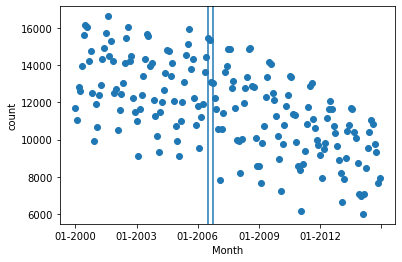

In [19]:
TimeSeriesPlot(df_crime_count_theft, column='count',
               figure_name='crime_count_larceny.png')

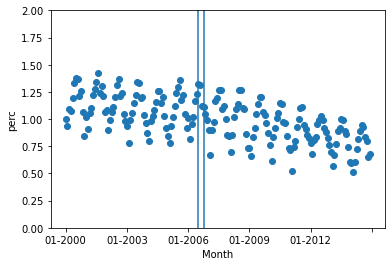

In [22]:
TimeSeriesPlot(df_crime_count_theft, column='perc', 
               ylim = (0, 2),
               figure_name='crime_count_larceny.png')

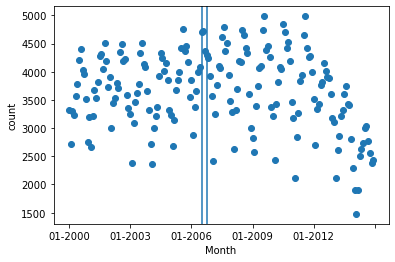

In [24]:
TimeSeriesPlot(df_crime_count_burglary, column = 'count')

In [27]:
CalcPerc(df_crime_count_burglary)
df_crime_count_burglary.head()

count      perc
Year Month                 
2000 1       3313  1.000000
     2       2724  0.822216
     3       3305  0.997585
     4       3240  0.977966
     5       3578  1.079988

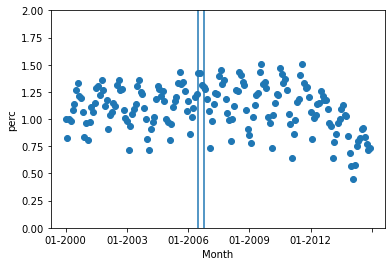

In [28]:
TimeSeriesPlot(df_crime_count_burglary, column = 'perc',
               ylim=(0,2))

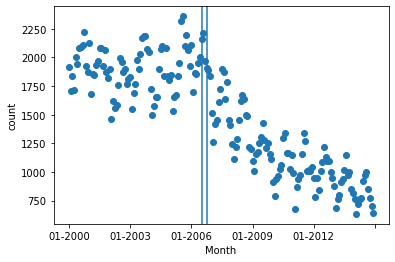

In [38]:
TimeSeriesPlot(df_motor_vehicle_theft, column='count')

In [39]:
CalcPerc(df_motor_vehicle_theft)
df_motor_vehicle_theft.head()

count      perc
Year Month                 
2000 1       1916  1.000000
     2       1704  0.889353
     3       1838  0.959290
     4       1712  0.893528
     5       2007  1.047495

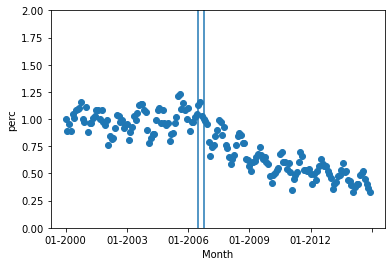

In [40]:
TimeSeriesPlot(df_motor_vehicle_theft, column='perc', ylim=(0,2))

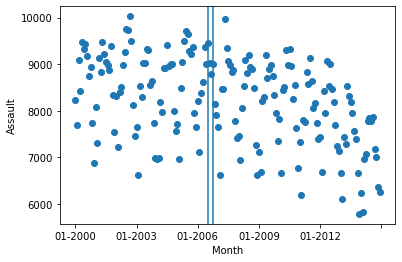

In [20]:
TimeSeriesPlot(df_crimes, column='Assault')

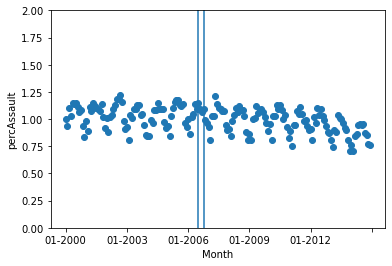

In [34]:
TimeSeriesPlot(df_crimes, column='percAssault', ylim=(0,2))

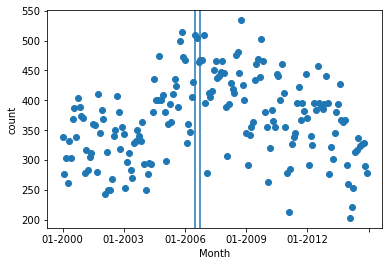

In [42]:
TimeSeriesPlot(df_robbery, column='count')

In [43]:
CalcPerc(df_robbery)
df_robbery.head()

count      perc
Year Month                 
2000 1        338  1.000000
     2        276  0.816568
     3        303  0.896450
     4        262  0.775148
     5        332  0.982249

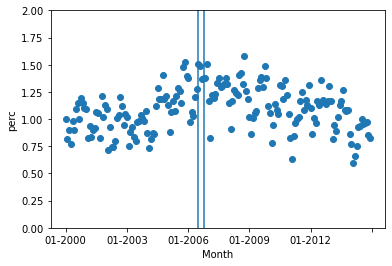

In [44]:
TimeSeriesPlot(df_robbery, column='perc', ylim=(0,2))

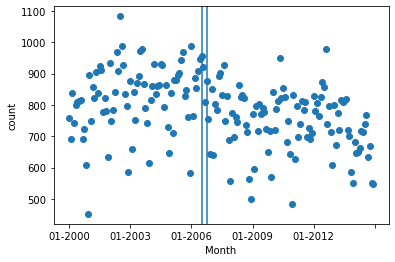

In [32]:
TimeSeriesPlot(df_sex_offenses, column='count')

In [33]:
CalcPerc(df_sex_offenses)
df_sex_offenses.head()

count      perc
Year Month                 
2000 1        759  1.000000
     2        690  0.909091
     3        837  1.102767
     4        741  0.976285
     5        799  1.052701

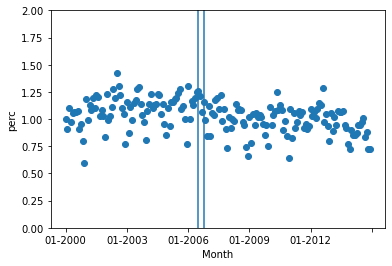

In [35]:
TimeSeriesPlot(df_sex_offenses, column='perc', ylim=(0,2))

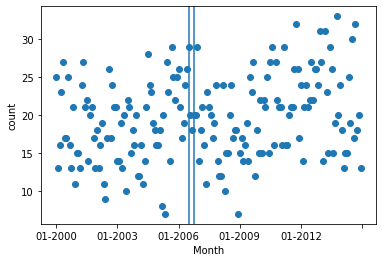

In [48]:
TimeSeriesPlot(df_homicide, column='count')

In [49]:
CalcPerc(df_homicide)
df_homicide.head()

count  perc
Year Month             
2000 1         25  1.00
     2         13  0.52
     3         16  0.64
     4         23  0.92
     5         27  1.08

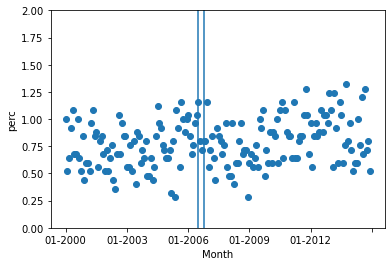

In [50]:
TimeSeriesPlot(df_homicide, column='perc', ylim=(0,2))

In [30]:
df_crime_count.loc[df_crime_count['date']=='02-2014']['count']

169    24221
Name: count, dtype: int64

In [8]:
# make crime rate column
df_crime_count = df_crime_count.merge(mipopl,left_on=['Year', 'Month'],right_on=['year','month']).drop(['year', 'month'], axis=1)
df_crime_count['rate'] = df_crime_count['count']/df_crime_count['popl']*100000

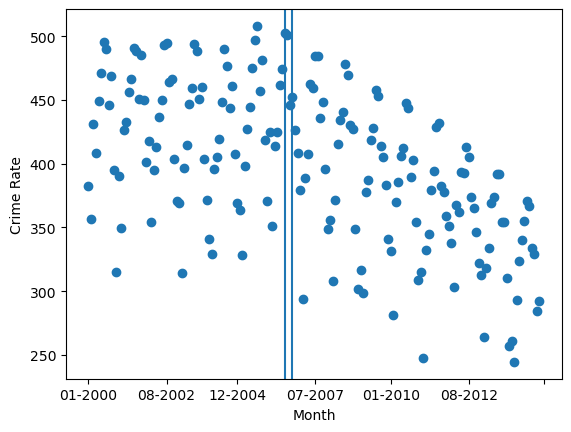

In [24]:
# plot the crime rate of the relevant years
fig, ax = plt.subplots()
plt.plot_date(df_crime_count['date'], df_crime_count['rate'])
plt.xlabel('Month')
plt.ylabel('Crime Rate')
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.axvline(x='07-2006')
plt.axvline(x='10-2006')
plt.savefig("crime_rate.png")
plt.show();

In [46]:
# plot interactive graph for inspection
crime_rate_data = px.scatter(x=df_crime_count.date,
                            y=df_crime_count.rate)
fig.add_shape(
    type='line',
    yref='y',
    xref='x',
    x0='10-2006',
    y0=df_crime_count['rate'].min()*.93,
    x1='10-2006',
    y1=df_crime_count['rate'].max()*1.05,
    line=dict(color="RoyalBlue")
)
fig.add_shape(
    type='line',
    yref='y',
    xref='x',
    x0='07-2006',
    y0=df_crime_count['rate'].min()*.93,
    x1='07-2006',
    y1=df_crime_count['rate'].max()*1.05,
    line=dict(color="RoyalBlue")
)
fig.update_layout(
    title='',
    margin=dict(t=20)
)
pio.write_html(fig, file='crime_rate_data.html')
fig.show();

In [10]:
colors = px.colors.qualitative.Alphabet
Months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

In [37]:
# plot interactive graph for inspection of year-on-year crime rate change
fig = px.scatter(df_crime_count,
    x="date",
    y="rate",
    labels={
        'rate': 'Crimes per 100,000 Population'
    },
    color_discrete_sequence=px.colors.qualitative.Alphabet,
    opacity=0
)
for i in range(0,12):
    fig.add_trace(
        go.Scatter(
            x=df_crime_count.loc[df_crime_count['Month']==i+1]['date'],
            y=df_crime_count.loc[df_crime_count['Month']==i+1]['rate'],
            name=Months[i],
            marker=dict(
                color=colors[i],
                size=10
            ),
            marker_symbol = SymbolValidator().values[8*i]
        ),
    )
fig.add_shape(
    type='line',
    yref='y',
    xref='x',
    x0='10-2006',
    y0=df_crime_count['rate'].min()*.93,
    x1='10-2006',
    y1=df_crime_count['rate'].max()*1.05
)
fig.add_shape(
    type='line',
    yref='y',
    xref='x',
    x0='07-2006',
    y0=df_crime_count['rate'].min()*.93,
    x1='07-2006',
    y1=df_crime_count['rate'].max()*1.05
)
fig.update_layout(
#     title='Crime Rate',
    margin=dict(t=20)
)
pio.write_html(fig, file='crime_rate.html')
fig.write_image("crime_rate_yoy.png")
fig.show();

In [49]:
df_crime_count['jDate'] = pd.to_datetime(df_crime_count['date']).apply(pd.Timestamp.to_julian_date)

In [56]:
df_crime_count.insert(2,'Months', range(1, 1+len(df_crime_count)))

In [57]:
df_crime_count.head()

,Year,Month,Months,count,date,popl,rate,jDate
0,2000,1,1,37876,01-2000,9.908112e+06,382.272607,2451544.5
1,2000,2,2,35398,02-2000,9.915502e+06,356.996546,2451575.5
2,2000,3,3,42777,03-2000,9.922892e+06,431.094095,2451604.5
3,2000,4,4,40595,04-2000,9.930281e+06,408.800103,2451635.5
4,2000,5,5,44608,05-2000,9.937671e+06,448.877818,2451665.5


In [89]:
# detect structural break
# adapted from datacamp: https://campus.datacamp.com/courses/quantitative-risk-management-in-python/estimating-and-identifying-risk?ex=7
def ChowTest(x, y, BreakPoint, length):
    x = sm.add_constant(x)
    res = sm.OLS(y, x).fit()
    y_before = y.loc[:BreakPoint]
    x_before = x.loc[:BreakPoint]
    res_before = sm.OLS(y_before, x_before).fit()
    y_after = y.loc[BreakPoint+1:]
    x_after = x.loc[BreakPoint+1:]
    res_after = sm.OLS(y_after, x_after).fit()
    numerator = (res.ssr - (res_before.ssr + res_after.ssr))/2
    denominator = (res_before.ssr + res_after.ssr)/(length-4)
    chow_test = numerator/denominator
    crit = scipy.stats.f.ppf(q = 1- .01, dfn=2, dfd=length-4)
    print(
        "Parameters for the regression of the whole time period: \n", res.params,
        ";\n\nStandard errors for the regression of the whole time period: \n", res.bse,
        ";\n\nR-squared for the regression of the whole time period: \n", res.rsquared,
        ";\n\nSSR for the regression of the whole time period: \n", res.ssr,
        ";\n\nParameters for the time period before SYG: \n", res_before.params,
        ";\n\nStandard errors for the time period before SYG: \n", res_before.bse,
        ";\n\nR-squared for the time period before SYG: \n", res_before.rsquared,
        ";\n\nSSR for the time period before SYG: \n", res_before.ssr,
        ";\n\nParameters for the time period after SYG: \n", res_after.params,
        ";\n\nStandard errors for the time period after SYG: \n", res_after.bse,
        ";\n\nR-squared for the time period after SYG: \n", res_after.rsquared,
        ";\n\nSSR for the time period after SYG: \n", res_after.ssr,
        ";\n\nChow test statistic: ", chow_test, "; Critical value, 99.9%: ", crit
    )

In [90]:
# test for structural break for 10-2006
ChowTest(df_crime_count['Months'], df_crime_count['rate'], 82, 180)

Parameters for the regression of the whole time period: 
 const     455.262563
Months     -0.634222
dtype: float64 ;

Standard errors for the regression of the whole time period: 
 const     7.660763
Months    0.073410
dtype: float64 ;

R-squared for the regression of the whole time period: 
 0.29544101156596236 ;

SSR for the regression of the whole time period: 
 466178.6159714492 ;

Parameters for the time period before SYG: 
 const     423.634089
Months      0.144853
dtype: float64 ;

Standard errors for the time period before SYG: 
 const     10.966425
Months     0.226800
dtype: float64 ;

R-squared for the time period before SYG: 
 0.005010761821011123 ;

SSR for the time period before SYG: 
 198500.07195926853 ;

Parameters for the time period after SYG: 
 const     504.584881
Months     -1.014959
dtype: float64 ;

Standard errors for the time period after SYG: 
 const     23.947910
Months     0.177475
dtype: float64 ;

R-squared for the time period after SYG: 
 0.25610249622053

## Monthly Counts by the ORI

In [59]:
df_crime_count_ori = pd.read_csv('crime_count_ori.csv')

,Year,Month,ORI,count
0,2000,1,MI0100100,5
1,2000,2,MI0100100,4
2,2000,3,MI0100100,3
3,2000,4,MI0100100,5
4,2000,5,MI0100100,16


In [120]:
df_crime_count_ori['Year'].max()

2014

In [119]:
df_crime_count_ori[df_crime_count_ori['Year'] == 2000]

,ORI,Year,Month,count,CountYoY,CountPercChg
0,MI0100100,2000,1,5.0,NaN,NaN
1,MI0100100,2000,2,4.0,NaN,NaN
2,MI0100100,2000,3,3.0,NaN,NaN
3,MI0100100,2000,4,5.0,NaN,NaN
4,MI0100100,2000,5,16.0,NaN,NaN
...,...,...,...,...,...,...
109807,MI8356900,2000,8,11.0,NaN,NaN
109808,MI8356900,2000,9,6.0,NaN,NaN
109809,MI8356900,2000,10,15.0,NaN,NaN
109810,MI8356900,2000,11,10.0,NaN,NaN


In [60]:
# rearrange columns
cols = df_crime_count_ori.columns.tolist()
cols = [cols[2]] + cols[0:2] + [cols[3]]
df_crime_count_ori = df_crime_count_ori[cols]

# add in years and months where no crime has happened for an ORI (for plotting)
mux = pd.MultiIndex.from_product([df_crime_count_ori['ORI'].unique(), 
                                  df_crime_count_ori['Year'].unique(),
                                  df_crime_count_ori['Month'].unique()], 
                                 names=('ORI','Year','Month'))
df_crime_count_ori = df_crime_count_ori.set_index(['ORI','Year','Month']).reindex(mux)
df_crime_count_ori['count'] = df_crime_count_ori['count'].fillna(0)
df_crime_count_ori = df_crime_count_ori.reset_index()

In [61]:
# create a column of year on year change
df_crime_count_ori['CountYoY'] = df_crime_count_ori.groupby('ORI')['count'].diff(12)

In [62]:
# percentage change
df_crime_count_ori['CountLag12'] = df_crime_count_ori.groupby('ORI')['count'].shift(12)
df_crime_count_ori['CountPercChg'] = df_crime_count_ori['CountYoY']/df_crime_count_ori['CountLag12']*100
df_crime_count_ori = df_crime_count_ori.drop('CountLag12',axis=1)
df_crime_count_ori['CountPercChg'] = df_crime_count_ori['CountPercChg'].replace(np.inf, np.nan)

In [63]:
df_crime_count_ori.head()

,ORI,Year,Month,count,CountYoY,CountPercChg
0,MI0100100,2000,1,5.0,NaN,NaN
1,MI0100100,2000,2,4.0,NaN,NaN
2,MI0100100,2000,3,3.0,NaN,NaN
3,MI0100100,2000,4,5.0,NaN,NaN
4,MI0100100,2000,5,16.0,NaN,NaN


In [79]:
# obtain the text file
text_file = '../Data/NIBRS/NIBRS_2000_batch_header_1.txt'
# parse batch header 1 data
fwidths = [2, 2, 9, 12, 8, 8, 30, 2, 2, 1, 1, 1]
# read and label the data
df_batch_header_1 = pd.read_fwf(text_file, widths = fwidths, 
                           names = ['Segment Level', 'Numeric State Code',
                                    'ORI', 'Incident Number', 'Date Added', 'NIBRS Date',
                                    'City Name', 'State Abbr', 'Popl Group', 'Country Division',
                                    'Country Region', 'Agency Indicator'])
# keep crimes in the state of Michigan
df_batch_header_1 = df_batch_header_1[df_batch_header_1['Numeric State Code'] == 21]
# keep data from ORIs that reported all throughout the sample period
df_batch_header_1 = df_batch_header_1.merge(df_oris, on='ORI')

In [90]:
df_batch_header_1['Agency Indicator'] = df_batch_header_1['Agency Indicator'].astype(int)

In [93]:
# dataframe with the type of each agency
df_type_of_agency = df_batch_header_1[['ORI', 'Agency Indicator']]

In [64]:
# Computes the differences in crime counts between different years
# For the same month
def DiffOverYears(df, StartYear, EndYear, Month):
    # select relevant years and month
    df = df[((df['Year'] == StartYear) | (df['Year'] == EndYear)) & (df['Month'] == Month)]
    
    # drop ORIs with too small sample sizes
    df = pd.pivot_table(df, values='count', index=['ORI'], 
                        columns=['Year']).rename_axis(None, axis=1).reset_index()
    df = df[(df[StartYear] >= 10.0) & (df[EndYear] >= 10.0)] 
    
    # take difference
    col_name = str(StartYear*100 + Month) + '-' + str(EndYear*100 + Month)
    df[col_name] = df[EndYear] - df[StartYear]
    
    # calculate percentage
    df[col_name + '_PercChg'] = df[col_name]/df[StartYear]
    
    # drop unused columns
    df = df.drop([StartYear, EndYear, col_name], axis = 1)
    
    # return df
    return df

In [65]:
# Average across different months
def AvgBtwMonths(df, StartYear, EndYear, StartMonth, EndMonth):
    for month in range(StartMonth, EndMonth+1):
        if month != StartMonth:
            df2 = DiffOverYears(df, StartYear, EndYear, month)
            df1 = df1.merge(df2)
        else:
            df1 = DiffOverYears(df, StartYear, EndYear, month)
    df1['AvgPercChg'] = df1.iloc[: , 1:].mean(axis = 1)*100
    df1 = df1.iloc[:, [0, -1]]
    return df1

In [66]:
df_diff_bf = AvgBtwMonths(df_crime_count_ori, 2000, 2006, 4, 6)
df_diff_bf.head()

,ORI,AvgPercChg
0,MI0110100,89.349539
1,MI0200200,-22.126437
2,MI0300300,-0.885471
3,MI0310300,58.870918
4,MI0321000,-13.694424


In [94]:
df_diff_bf = df_diff_bf.merge(df_type_of_agency, on='ORI')

In [98]:
df_diff_bf

,ORI,AvgPercChg,Agency Indicator
0,MI0110100,89.349539,2
1,MI0200200,-22.126437,4
2,MI0300300,-0.885471,4
3,MI0310300,58.870918,2
4,MI0321000,-13.694424,1
...,...,...,...
351,MI8294700,-1.995671,1
352,MI8296500,-35.900654,1
353,MI8308300,-15.261102,4
354,MI8318300,-33.020349,2


In [97]:
df_diff_bf.groupby('Agency Indicator').count()

,ORI,AvgPercChg
Agency Indicator,,
1,218,218
2,62,62
3,5,5
4,70,70
5,1,1


In [68]:
df_diff_af = AvgBtwMonths(df_crime_count_ori, 2006, 2014, 10, 12)
df_diff_af.head()

,ORI,AvgPercChg
0,MI0110100,-40.474910
1,MI0300300,-27.421537
2,MI0310300,-34.464127
3,MI0321000,-17.349240
4,MI0367000,-43.809524


## Map of reporting agencies

### Monthly Data at ORI Level

In [3]:
# crime count data
df_crime_count_ori = pd.read_csv('crime_count_ori.csv')

In [44]:
# check the distribution of crime counts in the data
df_crime_count_ori['count'].describe()

count    109980.000000
mean         64.902646
std         129.168017
min           0.000000
25%           7.000000
50%          23.000000
75%          63.000000
max        1921.000000
Name: count, dtype: float64

In [421]:
# check the distribution of crime counts in the data for June 2000
df_crime_count_ori[(df_crime_count_ori['Year']==2000) & \
                   (df_crime_count_ori['Month']==6)]['count'].describe()

count     611.000000
mean       76.639935
std       148.038336
min         0.000000
25%         8.000000
50%        27.000000
75%        75.000000
max      1511.000000
Name: count, dtype: float64

### ORI Shapefile
For plotting

In [8]:
# shape file with all reporting agencies
fp = "../Data/CSLLEA/Local_Law_Enforcement_Locations-shp/Local_Law_Enforcement.shp"
map_rep_agencies = gpd.read_file(fp)
map_rep_agencies_mi = map_rep_agencies[map_rep_agencies['STATE']=='MI']

# change coordinates into consistent formatting
map_rep_agencies_mi = map_rep_agencies_mi.to_crs({'init': 'epsg:4326'})

In [25]:
map_rep_agencies_mi = map_rep_agencies_mi.reset_index(drop=True)

In [37]:
map_rep_agencies_mi.iloc[350:360]['CITY']

350       DEARBORN
351           HART
352            MIO
353      REED CITY
354       FREEPORT
355        LANSING
356        LANSING
357        DETROIT
358       PLYMOUTH
359    CENTER LINE
Name: CITY, dtype: object

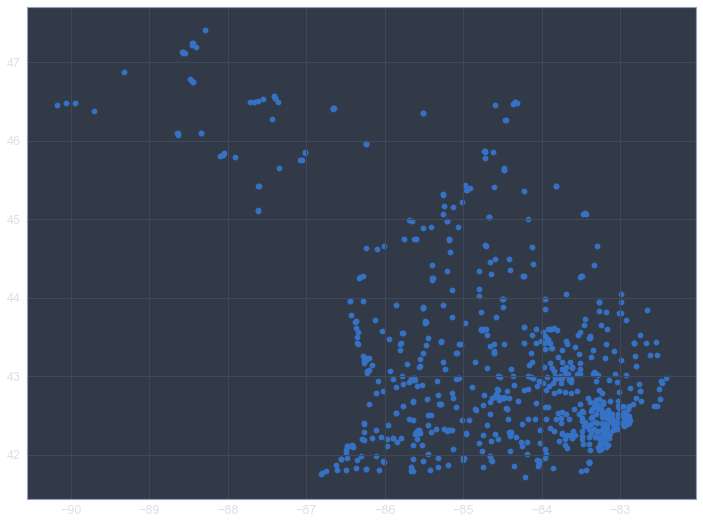

In [284]:
f, ax = plt.subplots(1, figsize=(12,12))
ax = map_rep_agencies_mi.plot(ax=ax)
plt.show;

### ORI-CSLLEA Crosswalk

In [1]:
# the crosswalk matches ORI to CSLLEA08 identifiers
df_crosswalk = pd.read_stata( \
    '../Data/BJS/Law Enforcement Agency Identifier Crosswalk, United States, 2012/35158-0001-Data.dta')
df_crosswalk = df_crosswalk[df_crosswalk['FSTATE'] == 'Michigan']

In [38]:
df_crosswalk

,FSTATE,FCOUNTY,FPLACE,FIPS_ST,FIPS_COUNTY,FIPS,ORI9,ORI7,NAME,UA,STATENAME,COUNTYNAME,UANAME,PARTOF,AGCYTYPE,SUBTYPE1,SUBTYPE2,GOVID,LG_NAME,ADDRESS_NAME,ADDRESS_STR1,ADDRESS_STR2,ADDRESS_CITY,ADDRESS_STATE,ADDRESS_ZIP,REPORT_FLAG,CSLLEA08_ID,LEMAS_ID,U_STATENO,U_CNTY,U_POPGRP,U_TPOP,LG_POPULATION,CSLLEA_SUB,COMMENT,INTPTLAT,INTPTLONG,CONGDIST1,CONGDIST2_18,DISTNAME,SOURCE_CSLLEA2008,SOURCE_UCR2010,SOURCE_UCR2011,SOURCE_UCR2012,SOURCE_NCIC2012,SOURCE_VENDOR
13312,Michigan,1,36860,26,001,26001,MI0146100,MI01461,HARRISVILLE PD,Not a Census place,MICHIGAN,ALCONA,_Not a Census place,Parent agency,Local police department,Not applicable,Not applicable,232001001,HARRISVILLE CITY,HARRISVILLE POLICE DEPT,,,HARRISVILLE,MI,48740,ORI reported 0 offenses or did not report,Not in CSLLEA 2008,-1,Michigan,1,7,487,493,Exclude record,,44.682535,-82.834080,01,,Eastern District of Michigan,0,1,1,1,1,0
13313,Michigan,1,47560,26,001,26001,MI0153300,MI01533,LINCOLN PD,Not a Census place,MICHIGAN,ALCONA,_Not a Census place,Parent agency,Local police department,Not applicable,Not applicable,232001002,LINCOLN VILLAGE,LINCOLN POLICE DEPARTMENT,,,LINCOLN,MI,48742,ORI reported 0 offenses or did not report,Not in CSLLEA 2008,-1,Michigan,1,7,333,337,Exclude record,,44.682535,-82.834080,01,,Eastern District of Michigan,0,1,1,1,1,0
13314,Michigan,1,99001,26,001,26001,MI0110100,MI01101,ALCONA COUNTY SHERIFF'S OFFICE,Not a Census place,MICHIGAN,ALCONA,_Not a Census place,Parent agency,Sheriff's office,Not applicable,Not applicable,231001001,ALCONA COUNTY,ALCONA COUNTY SHERIFF'S OFFICE,214 W MAIN ST,,HARRISVILLE,MI,48740,ORI reported 1+ offenses,11669180,2310010010210100,Michigan,1,8C,10808,10942,Include record to appoximate CSLLEA,,44.682535,-82.834080,01,,Eastern District of Michigan,1,1,1,1,1,1
13315,Michigan,1,99001,26,001,26001,MI0100100,MI01001,SP: ALCONA COUNTY,Not a Census place,MICHIGAN,ALCONA,_Not a Census place,Part of larger agency,State law enforcement agency,Not applicable,Not applicable,230000000,State of Michigan,STATE POLICE: ALCONA COUNTY,,,LANSING,MI,48913,ORI reported 1+ offenses,Not in CSLLEA 2008,-1,Michigan,1,8D,0,Not local or sheriff agency,Exclude record,,44.682535,-82.834080,01,,Eastern District of Michigan,0,1,1,1,0,0
13316,Michigan,3,11960,26,003,26003,MI0227700,-1,BURT TOWNSHIP POLICE DEPARTMENT,Not a Census place,MICHIGAN,ALGER,_Not a Census place,Parent agency,Local police department,Not applicable,Not applicable,233002002,BURT TOWNSHIP,BURT TOWNSHIP POLICE DEPARTMENT,,,GRAND MARAIS,MI,,ORI reported 0 offenses or did not report,Not in CSLLEA 2008,-1,Not in UCR,Not in UCR,-1,Not in UCR,522,Exclude record,,47.080077,-86.564108,01,,Western District of Michigan,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14374,Michigan,165,50880,26,165,26165,MI8356900,MI83569,MANTON POLICE DEPARTMENT,Not a Census place,MICHIGAN,WEXFORD,_Not a Census place,Parent agency,Local police department,Not applicable,Not applicable,232083004,MANTON CITY,MANTON POLICE DEPARTMENT,402 NORTH MICHIGAN,,MANTON,MI,49663,ORI reported 1+ offenses,12382990,-1,Michigan,83,7,1288,1287,Include record to appoximate CSLLEA,,44.331375,-85.570046,04,,Western District of Michigan,1,1,1,1,1,1
14375,Michigan,165,53320,26,165,26165,MI8357400,MI83574,MESICK PD,Not a Census place,MICHIGAN,WEXFORD,_Not a Census place,Parent agency,Local police department,Not applicable,Not applicable,232083005,MESICK VILLAGE,MESICK POLICE DEPARTMENT,,,MESICK,MI,49668,ORI reported 0 offenses or did not report,Not in CSLLEA 2008,-1,Michigan,83,7,394,394,Exclude record,,44.331375,-85.570046,04,,Western District of Michigan,0,1,1,1,1,0
14376,Michigan,165,74820,26,165,26165,MI8394300,-1,SOUTH BRANCH TWP PD WELLSTON,Not a Census place,MICHIGAN,WEXFORD,_Not a Census place,Parent agency,Local police department,Not applicable,Not applicable,233083014,SOUTH 

In [3]:
df_crosswalk.groupby('AGCYTYPE')['AGCYTYPE'].count()

AGCYTYPE
Local police department         668
Sheriff's office                 83
State law enforcement agency    224
Special jurisdiction             92
Constable/Marshal                 0
Federal                           0
Name: AGCYTYPE, dtype: int64

### Match Between ORI and CSLLEA

In [4]:
df_crime_count_ori = pd.read_csv('crime_count_ori.csv')

In [6]:
# list of ORIs that reported crimes in Jan 2000
temp = df_crime_count_ori[(df_crime_count_ori['Year'] == 2000) & (df_crime_count_ori['Month'] == 1)]

In [11]:
temp.shape

(551, 4)

In [5]:
# dictionary between ORI9 and CSLLEA08_ID in df_crosswalk
dict_ORI_CSLLEA08 = df_crosswalk.set_index('ORI9')['CSLLEA08_ID'].to_dict()

In [7]:
# list of ORIs that are not represented by a CSLLEA in Jan 2000
list_addl_agencies = []
for ORI in temp['ORI'].values:
    if dict_ORI_CSLLEA08.get(ORI) == 'Not in CSLLEA 2008':
        list_addl_agencies.append(ORI)

In [10]:
# number of ORIs that are not represented by a CSLLEA in Jan 2000
len(list_addl_agencies)

100

In [8]:
# make list_addl_agencies into a dataframe, merge with df_crosswalk, and keep the NAME field
df_addl_agencies = pd.DataFrame(list_addl_agencies, columns = ['ORI9'])

In [12]:
df_addl_agencies = df_addl_agencies.merge(df_crosswalk)

In [13]:
df_addl_agencies.columns

Index(['ORI9', 'FSTATE', 'FCOUNTY', 'FPLACE', 'FIPS_ST', 'FIPS_COUNTY', 'FIPS',
       'ORI7', 'NAME', 'UA', 'STATENAME', 'COUNTYNAME', 'UANAME', 'PARTOF',
       'AGCYTYPE', 'SUBTYPE1', 'SUBTYPE2', 'GOVID', 'LG_NAME', 'ADDRESS_NAME',
       'ADDRESS_STR1', 'ADDRESS_STR2', 'ADDRESS_CITY', 'ADDRESS_STATE',
       'ADDRESS_ZIP', 'REPORT_FLAG', 'CSLLEA08_ID', 'LEMAS_ID', 'U_STATENO',
       'U_CNTY', 'U_POPGRP', 'U_TPOP', 'LG_POPULATION', 'CSLLEA_SUB',
       'COMMENT', 'INTPTLAT', 'INTPTLONG', 'CONGDIST1', 'CONGDIST2_18',
       'DISTNAME', 'SOURCE_CSLLEA2008', 'SOURCE_UCR2010', 'SOURCE_UCR2011',
       'SOURCE_UCR2012', 'SOURCE_NCIC2012', 'SOURCE_VENDOR'],
      dtype='object')

In [14]:
# Examine what types of agencies are left out of the plots
df_addl_agencies.groupby('AGCYTYPE')['AGCYTYPE'].count()

AGCYTYPE
Local police department         15
Sheriff's office                 0
State law enforcement agency    82
Special jurisdiction             3
Constable/Marshal                0
Federal                          0
Name: AGCYTYPE, dtype: int64

In [53]:
# number of ORIs that are represented by a CSLLEA number in Jan 2000
temp.shape[0] - len(list_addl_agencies)

493

In [190]:
# number of crimes reported by the reporting agencies that have an ORI number, but not a CSLLEA number
# in Jan 2000
i = 0
for agency in list_addl_agencies:
    i+=temp.loc[temp['ORI']==agency]['count'].iloc[0]
print(i)

4490


In [195]:
# number of crimes reported by reporting agencies that have an ORI number, and also a CSLLEA number
# in Jan 2000
temp['count'].sum()-i

33386

In [192]:
# percent crimes captured by ORIs, but not captured in CSLLEA in Jan 2000
(temp['count'].sum()-i)/temp['count'].sum()

0.881455275108248

### Merge ORI Data with Crosswalk Data and Shapefile

In [10]:
# merge with crosswalk & with shapefile
# remove ORIs that don't have a CSLLEA ID
def MakeGeoDataFrame(df):
    # merge with crosswalk
    df = df.merge(
        df_crosswalk[['ORI9','CSLLEA08_ID']],left_on='ORI',right_on='ORI9').drop('ORI9',axis=1)
    
    # merge with shapefile
    df = df.merge(
        map_rep_agencies_mi[['NAME','CSLLEA08ID','geometry']],
        left_on='CSLLEA08_ID',right_on='CSLLEA08ID',how='inner'
    ).drop('CSLLEA08ID',axis=1)
    
    # create geodataframe data from dataframe
    gdf = gpd.GeoDataFrame(df, crs="EPSG:4326")
    gdf['x'] = [geometry.x for geometry in gdf['geometry']]
    gdf['y'] = [geometry.y for geometry in gdf['geometry']]
    gdf = gdf.drop('geometry',axis=1)
    
    return gdf

### Prepare County Shapefile

In [65]:
def GeoSource():
    # import Michigan county border data
    fp = "../Data/Geographical Data/cb_2018_us_county_5m/cb_2018_us_county_5m.shp"
    gdf_counties = gpd.read_file(fp)
    gdf_counties_mi = gdf_counties[gdf_counties['STATEFP']=='26']
    geosource = GeoJSONDataSource(geojson=gdf_counties_mi.to_json())
    return geosource

### Functions to Make Figure With

In [11]:
# Make color bar
def MyColorBar(palette, low, high):
    color_mapper = LinearColorMapper(palette = palette, low = low, high = high)
    ticks = np.around(np.linspace(low, high, 7), 1)    
    color_ticker = FixedTicker(ticks = ticks)
    tick_labels = {i:str(i) for i in ticks}
    tick_labels[low] = '<' + tick_labels[low]
    tick_labels[high] = tick_labels[high] + '+'
    color_bar = ColorBar(color_mapper = color_mapper,
                         label_standoff = 8,
                         width = 500, height = 20,
                         border_line_color = None,
                         location = (0, 0),
                         orientation = 'horizontal',
                         ticker = color_ticker,
                         major_label_overrides = tick_labels)
    return color_mapper, color_bar

In [12]:
# Make figure that incorporates the color bar
def MyFigure(title, geosource, columnsource, field, color_mapper, color_bar):
    p = figure(title = title, plot_height = 600, plot_width = 600,
               toolbar_location = "below", tools = "pan, wheel_zoom, box_zoom, reset")
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    counties = p.patches("xs", "ys", source = geosource, fill_color = None,
                         line_color = "gray", line_width = .25, fill_alpha = 1)
    oris = p.circle(x = "x", y = "y", source = columnsource, alpha = .9,
                    color = {"field": field, "transform": color_mapper})
    p.add_tools(HoverTool(renderers = [counties], tooltips = [("County", "@NAME")]))
    p.add_tools(HoverTool(renderers = [oris], tooltips = [('Department', "@NAME"),
                                                          ('Perc Chg', '@'+field)]))
    p.add_layout(color_bar, 'below')
    return p

In [13]:
# Define color palettes
palette = Spectral6
# palette = brewer['BuGn'][8]
# palette = palette[::-1] # reverse order of colors so higher values have darker colors

In [74]:
output_notebook()

Loading BokehJS ...

### Before/After Law Comparison by the ORI in Percentage Change

In [15]:
def MakeColumnSource(df):
    gdf = MakeGeoDataFrame(df)
    print(gdf['AvgPercChg'].plot(kind='kde'))
    columnsource = ColumnDataSource(gdf)
    return columnsource

In [218]:
reset_output()
output_file("chgbf.html")

In [211]:
reset_output()
output_notebook()

Loading BokehJS ...

AxesSubplot(0.125,0.125;0.775x0.755)


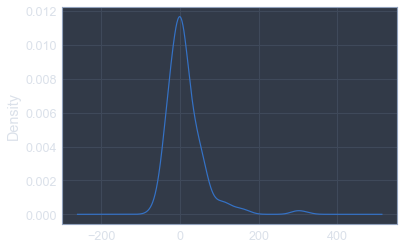

In [99]:
columnsource = MakeColumnSource(df_diff_bf);

In [103]:
columnsource.data

{'index': array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
        156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
        169, 170, 171, 172, 173, 174, 175,

In [221]:
# make geosource
geosource = GeoSource()

# call function to make color bar
color_bar = MyColorBar(palette, -100, 100)

# make figure
p = MyFigure("Change Before Law (2000-2006)", geosource, columnsource, 
             'AvgPercChg', color_bar[0], color_bar[1])

# save figure
show(p)

<class 'str'>


In [222]:
# after law
reset_output()
output_file("chgaf.html")

In [ ]:
reset_output()
output_notebook()

AxesSubplot(0.125,0.125;0.775x0.755)


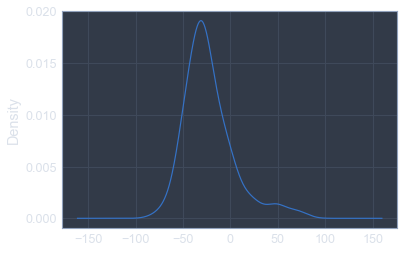

In [224]:
columnsource = MakeColumnSource(df_diff_af);

In [225]:
# make geosource
geosource = GeoSource()

# call function to make color bar
color_bar = MyColorBar(palette, -100, 100)

p = MyFigure("Change After Law (2006-2014)", geosource, columnsource, 
             'AvgPercChg', color_bar[0], color_bar[1])

show(p)

<class 'str'>


### YoY Data

In [23]:
df_crime_count_ori = PlottingPrep(df_crime_count_ori)

,ORI,Year,Month,count,CountYoY,CountPercChg,CSLLEA08_ID
0,MI0100100,2000,1,5.0,NaN,NaN,Not in CSLLEA 2008
1,MI0100100,2000,2,4.0,NaN,NaN,Not in CSLLEA 2008
2,MI0100100,2000,3,3.0,NaN,NaN,Not in CSLLEA 2008
3,MI0100100,2000,4,5.0,NaN,NaN,Not in CSLLEA 2008
4,MI0100100,2000,5,16.0,NaN,NaN,Not in CSLLEA 2008
...,...,...,...,...,...,...,...
109975,MI8356900,2014,8,0.0,0.0,NaN,12382990
109976,MI8356900,2014,9,0.0,0.0,NaN,12382990
109977,MI8356900,2014,10,0.0,0.0,NaN,12382990
109978,MI8356900,2014,11,0.0,0.0,NaN,12382990


In [377]:
# create date column
df_crime_count_ori['Date'] = pd.to_datetime(df_crime_count_ori['Year'].astype(str) + \
               '-' + df_crime_count_ori['Month'].astype(str)).dt.strftime('%b %Y')

In [379]:
# list of dates
ls_dates = df_crime_count_ori['Date'].unique().tolist()

In [380]:
df_crime_count_ori

,ORI,Year,Month,count,CountYoY,CountPercChg,CSLLEA08_ID,NAME,geometry,Date
180,MI0110100,2000,1,15.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,POINT (-83.29718 44.65681),Jan 2000
181,MI0110100,2000,2,17.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,POINT (-83.29718 44.65681),Feb 2000
182,MI0110100,2000,3,12.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,POINT (-83.29718 44.65681),Mar 2000
183,MI0110100,2000,4,21.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,POINT (-83.29718 44.65681),Apr 2000
184,MI0110100,2000,5,22.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,POINT (-83.29718 44.65681),May 2000
...,...,...,...,...,...,...,...,...,...,...
109975,MI5929100,2014,8,7.0,7.0,NaN,12341090,CARSON CITY POLICE DEPARTMENT,POINT (-84.84550 43.17727),Aug 2014
109976,MI5929100,2014,9,4.0,4.0,NaN,12341090,CARSON CITY POLICE DEPARTMENT,POINT (-84.84550 43.17727),Sep 2014
109977,MI5929100,2014,10,2.0,2.0,NaN,12341090,CARSON CITY POLICE DEPARTMENT,POINT (-84.84550 43.17727),Oct 2014
109978,MI5929100,2014,11,2.0,2.0,NaN,12341090,CARSON CITY POLICE DEPARTMENT,POINT (-84.84550 43.17727),Nov 2014


In [381]:
# convert DataFrame to GeoDataFrame
gdf_crime_count_ori = gpd.GeoDataFrame(df_crime_count_ori, crs="EPSG:4326")

In [382]:
# prepare for conversion to ColumnDataSource
gdf_crime_count_ori['x'] = [geometry.x for geometry in gdf_crime_count_ori['geometry']]
gdf_crime_count_ori['y'] = [geometry.y for geometry in gdf_crime_count_ori['geometry']]
gdf_crime_count_ori = gdf_crime_count_ori.drop('geometry',axis=1)

In [383]:
gdf_crime_count_ori

,ORI,Year,Month,count,CountYoY,CountPercChg,CSLLEA08_ID,NAME,Date,x,y
180,MI0110100,2000,1,15.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,Jan 2000,-83.297180,44.656810
181,MI0110100,2000,2,17.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,Feb 2000,-83.297180,44.656810
182,MI0110100,2000,3,12.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,Mar 2000,-83.297180,44.656810
183,MI0110100,2000,4,21.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,Apr 2000,-83.297180,44.656810
184,MI0110100,2000,5,22.0,NaN,NaN,11669180,ALCONA COUNTY SHERIFFS DEPARTMENT / ALCONA COU...,May 2000,-83.297180,44.656810
...,...,...,...,...,...,...,...,...,...,...,...
109975,MI5929100,2014,8,7.0,7.0,NaN,12341090,CARSON CITY POLICE DEPARTMENT,Aug 2014,-84.845501,43.177273
109976,MI5929100,2014,9,4.0,4.0,NaN,12341090,CARSON CITY POLICE DEPARTMENT,Sep 2014,-84.845501,43.177273
109977,MI5929100,2014,10,2.0,2.0,NaN,12341090,CARSON CITY POLICE DEPARTMENT,Oct 2014,-84.845501,43.177273
109978,MI5929100,2014,11,2.0,2.0,NaN,12341090,CARSON CITY POLICE DEPARTMENT,Nov 2014,-84.845501,43.177273


In [385]:
# convert GeoDataFrame to ColumnDataSource for plotting
columnsource = ColumnDataSource(gdf_crime_count_ori)

In [386]:
# import Michigan county border data
fp = "../Data/Geographical Data/cb_2018_us_county_5m/cb_2018_us_county_5m.shp"
gdf_counties = gpd.read_file(fp)

In [387]:
gdf_counties_mi = gdf_counties[gdf_counties['STATEFP']=='26']

In [388]:
gdf_counties_mi

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
45,26,121,01623003,0500000US26121,26121,Muskegon,06,1305064357,2476380060,"POLYGON ((-86.46220 43.47233, -86.03949 43.467..."
76,26,155,01623018,0500000US26155,26155,Shiawassee,06,1375178357,25853173,"POLYGON ((-84.36789 43.12845, -84.16804 43.128..."
78,26,165,01623023,0500000US26165,26165,Wexford,06,1463148723,27182043,"POLYGON ((-85.81780 44.51297, -85.33400 44.512..."
136,26,129,01623007,0500000US26129,26129,Ogemaw,06,1459466633,29641292,"POLYGON ((-84.37064 44.50722, -83.88663 44.508..."
144,26,065,01622975,0500000US26065,26065,Ingham,06,1440364339,11878075,"POLYGON ((-84.60276 42.76988, -84.51235 42.769..."
...,...,...,...,...,...,...,...,...,...,...
2865,26,029,01622957,0500000US26029,26029,Charlevoix,06,1078288789,2522931119,"MULTIPOLYGON (((-85.38859 45.23524, -85.37159 ..."
2883,26,101,01622993,0500000US26101,26101,Manistee,06,1404616462,1912440723,"POLYGON ((-86.38006 44.18947, -86.36285 44.208..."
2917,26,027,01622956,0500000US26027,26027,Cass,06,1269367168,47147839,"POLYGON ((-86.22610 41.76002, -86.22345 41.898..."
2928,26,125,01623005,0500000US26125,26125,Oakland,06,2246566547,103166476,"POLYGON ((-83.68938 42.87126, -83.57105 42.873..."


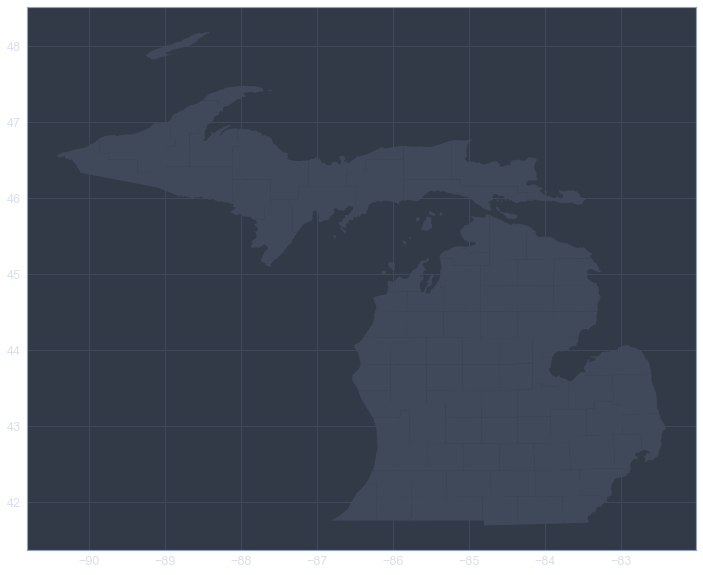

In [389]:
f, ax = plt.subplots(1, figsize=(12,12))
ax = gdf_counties_mi.plot(ax=ax)
plt.show;

In [390]:
geosource = GeoJSONDataSource(geojson=gdf_counties_mi.to_json())

In [191]:
output_file("CSLLEA.html")

In [45]:
reset_output()
output_notebook()

Loading BokehJS ...

In [401]:
field = 'CountYoY'

# Create figure object.
# Define color palettes
palette = Spectral6
# palette = brewer['BuGn'][8]
# palette = palette[::-1] # reverse order of colors so higher values have darker colors

# Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
color_mapper = LinearColorMapper(palette = palette, 
                                 low = -100, high = 100)

# use custom tickers
color_ticker = FixedTicker(ticks=[-100, -67, -33, 0, 33, 67, 100])

# Define custom tick labels for color bar.
tick_labels = {-100: '<-100', -67: '-67', -33: '-33', 0: '0',
               33: '33', 67: '67', 100:'100+'}

# Create color bar.
color_bar = ColorBar(color_mapper = color_mapper, 
                     label_standoff = 8,
                     width = 500, height = 20,
                     border_line_color = None,
                     location = (0,0), 
                     orientation = 'horizontal',
                     ticker = color_ticker,
                     major_label_overrides = tick_labels
                    )

# Create figure object.
p = figure(title = 'Change in Crime Count in ORIs in Michigan 2000-2014', 
               plot_height = 600 ,
               plot_width = 600, 
               toolbar_location = 'below',
               tools = "pan, wheel_zoom, box_zoom, reset")
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

# Add patch renderer to figure.
counties = p.patches('xs','ys',source=geosource,
                     fill_color=None,
                     line_color='gray',line_width=.25,fill_alpha=1)

# Make a slider object to toggle the date shown
slider = Slider(title = '', 
                start = 0, end = len(ls_dates)-1, value=0, step = 1)
slider.show_value = False
slider.tooltips = False

# Make a div object to display the date
div = Div(text = "Date: <b>" + str(ls_dates[slider.value]) + '</b>',
         render_as_text = False, width=575)

# This callback prints the year and month in a div object
callback = CustomJS(
    args={'div':div,'ls_dates':ls_dates, 'slider': slider, 'source': columnsource}, 
    code="""
        div.text = "Date: <b>" + ls_dates[slider.value] + '</b>';
        source.change.emit();
        """)
slider.js_on_change('value', callback)

# Creates custom filter that selects the rows of the month based on the value in the slider
custom_filter = CustomJSFilter(args=dict(columnsource=columnsource,ls_dates=ls_dates,slider=slider), code='''
var indices = [];
// iterate through rows of data source and see if each satisfies some constraint
for (var i = 0; i < columnsource.get_length(); i++){
    if (columnsource.data['Date'][i] == ls_dates[slider.value]){
        indices.push(true);
    } else {
        indices.push(false);
    }
}
return indices;
''')

view = CDSView(source=columnsource, filters=[custom_filter])

# Add circle renderer to figure.
oris = p.circle(x='x',y='y',source = columnsource,alpha=.9,
               color={'field':'CountYoY',
                          'transform':color_mapper}, view = view)

# Create hover tool
p.add_tools(HoverTool(renderers=[counties],
                      tooltips=[('County','@NAME')]
))
p.add_tools(HoverTool(renderers = [oris],
                      tooltips = [('Department','@NAME'),
                                  ('Count','@CountYoY')]))

# Specify layout
p.add_layout(color_bar, 'below')

# Make a column layout of widgetbox(slider) and plot, and add it to the current document
layout = column(div, slider, p)

show(layout)

## Monthly Counts Analysis

see R file "analysis.Rmd" for more information

# Nonviolent Crime Data

In [83]:
offense_2000 = r"../Data/NIBRS/NIBRS_2000_offenses.txt"
fwidths = [2,2,9,12,8,3,1,1,1,1,2,2,1,1,1,1,3,3,3,2,3]
df_offense_2000 = pd.read_fwf(offense_2000, widths = fwidths, names = ['Segment Level', 
                                                                       'Numeric State Code', 
                                                                       'Originating Agency Identifier (ORI)',
                                                                       'Incident Number',
                                                                       'Incident Date',
                                                                       'UCR Offense Code',
                                                                       'Offense Attempted/Completed',
                                                                       'Offender(s) Suspected of Using 1',
                                                                       'Offender(s) Suspected of Using 2',
                                                                       'Offender(s) Suspected of Using 3',
                                                                       'Location Type',
                                                                       'Number of Premises Entered',
                                                                       'Method of Entry',
                                                                       'Type of Criminal Activity 1',
                                                                       'Type of Criminal Activity 2',
                                                                       'Type of Criminal Activity 3',
                                                                       'Type of Weapon/Force Involved 1',
                                                                       'Type of Weapon/Force Involved 2',
                                                                       'Type of Weapon/Force Involved 3',
                                                                       'Bias Motivation',
                                                                       'Records per ORI-Incident Number'])

In [84]:
df_offense_2000.head()

,Segment Level,Numeric State Code,Originating Agency Identifier (ORI),Incident Number,Incident Date,UCR Offense Code,Offense Attempted/Completed,Offender(s) Suspected of Using 1,Offender(s) Suspected of Using 2,Offender(s) Suspected of Using 3,Location Type,Number of Premises Entered,Method of Entry,Type of Criminal Activity 1,Type of Criminal Activity 2,Type of Criminal Activity 3,Type of Weapon/Force Involved 1,Type of Weapon/Force Involved 2,Type of Weapon/Force Involved 3,Bias Motivation,Records per ORI-Incident Number
0,2,3,AR0580100,I0 -A3U72 N,20000210,290,C,N,NaN,NaN,18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88,1.0
1,2,3,AR0580100,I0 -A5U72 N,20000207,13B,C,N,NaN,NaN,20,NaN,NaN,NaN,NaN,NaN,40,NaN,NaN,88,1.0
2,2,3,AR0580100,I0 -ABU72 N,20000210,250,A,N,NaN,NaN,25,NaN,NaN,U,NaN,NaN,NaN,NaN,NaN,88,1.0
3,2,3,AR0580100,I0 -AZU72 N,20000210,240,C,N,NaN,NaN,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,88,1.0
4,2,3,AR0580100,I0 -B5U72 N,20000210,250,C,N,NaN,NaN,21,NaN,NaN,U,NaN,NaN,NaN,NaN,NaN,88,1.0


In [86]:
df_offense_2000.dtypes

Segment Level                            int64
Numeric State Code                       int64
Originating Agency Identifier (ORI)     object
Incident Number                         object
Incident Date                            int64
UCR Offense Code                        object
Offense Attempted/Completed             object
Offender(s) Suspected of Using 1        object
Offender(s) Suspected of Using 2        object
Offender(s) Suspected of Using 3        object
Location Type                            int64
Number of Premises Entered             float64
Method of Entry                         object
Type of Criminal Activity 1             object
Type of Criminal Activity 2             object
Type of Criminal Activity 3             object
Type of Weapon/Force Involved 1         object
Type of Weapon/Force Involved 2         object
Type of Weapon/Force Involved 3         object
Bias Motivation                          int64
Records per ORI-Incident Number        float64
dtype: object

In [85]:
df_offense_2000.shape

(2864911, 21)

In [ ]:
df_offense_2000['Incident Date'] = pd.to_datetime

# Awareness

In [40]:
awareness = pd.read_csv("SYG-2005-2014.csv", skiprows=1)

In [41]:
awareness.columns = ["Month", "Search Intensity"]

In [42]:
awareness['Awareness'] = awareness['Search Intensity'].cumsum()

In [64]:
awareness['Awareness'] /= awareness['Awareness'].max()

In [67]:
awareness['Awareness'] *= 100

Text(0.5, 0, 'Months')

Text(0, 0.5, 'Search Intensity')

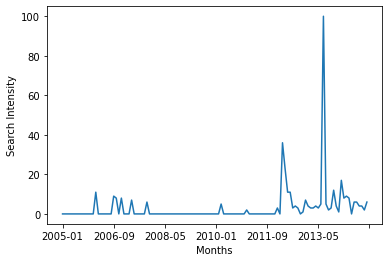

In [63]:
plt.plot(awareness['Month'], awareness['Search Intensity'])
plt.gca().xaxis.set_major_locator(plticker.AutoLocator())
plt.xlabel('Months')
plt.ylabel('Search Intensity')
plt.savefig('search-intensity.png')
plt.show()

Text(0.5, 0, 'Months')

Text(0, 0.5, 'Awareness')

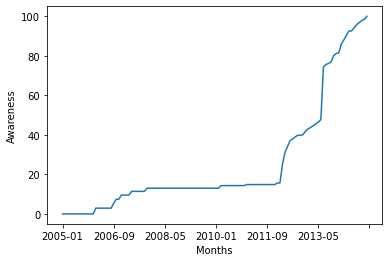

In [70]:
plt.plot(awareness['Month'], awareness['Awareness'])
plt.gca().xaxis.set_major_locator(plticker.AutoLocator())
plt.xlabel('Months')
plt.ylabel('Awareness')
plt.savefig('awareness.png')
plt.show()

# other stuff

In [747]:
import pandas as pd
from bokeh.plotting import show
from bokeh.models import RangeSlider, Div, Column, CustomJS

In [740]:
data = {'date_start': ['2018-12', '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09', '2019-10', '2019-11'],  
        'date_end': [ '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-12'], 
        'values' : [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]}
df = pd.DataFrame(data)

In [741]:
df['Start'] = pd.to_datetime(df['date_start'], format='%Y-%m')
df['End'] = pd.to_datetime(df['date_end'], format='%Y-%m')

In [742]:
number_dates = len(list(df.date_start.unique()))

In [743]:
start_dates = df.date_start.to_list()
end_dates = df.date_end.to_list()

In [749]:
range_slider = RangeSlider(start=0, end=number_dates, value=(0, number_dates), callback_policy = 'mouseup', step=1, title="", tooltips = False, width=600, show_value = False)
div = Div(text = "Date Range: <b>" + str(start_dates[range_slider.value[0]]) + ' . . . ' + str(end_dates[range_slider.value[1]-1]) + '</b>', render_as_text = False, width = 575)

In [751]:
code = '''
range = Math.round(Number(cb_obj.value[1] - cb_obj.value[0]), 10)
range = range < 10 ? '0' + range : range
div.text = "Date Range: <b>" + start_dates[Math.round(cb_obj.value[0], 10)] + '&nbsp;.&nbsp;.&nbsp;.&nbsp;' + end_dates[Math.round(cb_obj.value[1], 10) + -1] + '</b>'
'''

In [752]:
range_slider.js_on_change('value_throttled', CustomJS(args = {'div': div, 'start_dates': start_dates, 'end_dates': end_dates}, code=code))

In [753]:
show(Column(div, range_slider))